# Growth Mechanism with Details

In [30]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import sys
import numpy as np
import os
import matplotlib.pyplot as plt
from matplotlib import gridspec
from matplotlib import colors

sys.path.append('../../src')
from m3_learning.nn.random import random_seed
from m3_learning.viz.style import set_style
from m3_learning.viz.printing import printer
from m3_learning.viz.layout import imagemap, layout_fig, labelfigs
from m3_learning.RHEED.Dataset import RHEED_parameter_dataset, RHEED_spot_Dataset
from m3_learning.RHEED.Viz import Viz
from m3_learning.RHEED.Analysis import detect_peaks, analyze_curves, process_rheed_data , fit_exp_function
from m3_learning.RHEED.Packed_functions import decay_curve_examples

printing = printer(basepath = 'Figures/3.Growth_mechanism/')
printing_plot = printer(basepath = 'Figures/3.Growth_mechanism/', fileformats=['png'], dpi=1200)
if not os.path.isdir('Saved_data'): os.mkdir('Saved_data')
set_style("printing")
random_seed(seed=42)

plot_size = (6, 2)
color_blue = (44/255,123/255,182/255)
color_gray = (128/255, 128/255, 128/255, 0.5)
seq_colors = ['#00429d','#2e59a8','#4771b2','#5d8abd','#73a2c6','#8abccf','#a5d5d8','#c5eddf','#ffffe0']
bgc1, bgc2 = (*colors.hex2color(seq_colors[0]), 0.3), (*colors.hex2color(seq_colors[5]), 0.3)

def fit_curves(xs, ys, x_peaks, sample_x):
    fit_settings = {'savgol_window_order': (15, 3), 'pca_component': 10, 'I_diff': 15000, 
                'unify':False, 'bounds':[0.001, 1], 'p_init':[0.1, 0.4, 0.1]}

    x_end = 0
    length_list = []
    for xi in xs:
        length_list.append(len(xi))

    xs, ys = process_rheed_data(xs, ys, length=int(np.mean(length_list)), savgol_window_order=fit_settings['savgol_window_order'], 
                                pca_component=fit_settings['pca_component'])        

    parameters_all, x_list_all = [], []
    xs_all, ys_all, ys_fit_all, ys_nor_all, ys_nor_fit_all, ys_nor_fit_failed_all = [], [], [], [], [], []
    labels_all, losses_all =  [], []

    # fit exponential function
    parameters, info = fit_exp_function(xs, ys, growth_name='growth_1', fit_settings=fit_settings)        
    parameters_all.append(parameters)
    xs, ys, ys_fit, ys_nor, ys_nor_fit, ys_nor_fit_failed, labels, losses = info
    xs_all.append(xs)
    ys_all.append(ys)
    ys_fit_all+=ys_fit
    ys_nor_all+=ys_nor
    ys_nor_fit_all+=ys_nor_fit
    ys_nor_fit_failed_all+=ys_nor_fit_failed
    labels_all += labels
    losses_all += losses

    x_list = x_peaks[:-1] + x_end
    x_end = round(x_end + (len(sample_x)+0)/30, 2)
    x_list_all.append(x_list)
        
    parameters_all = np.concatenate(parameters_all, 0)
    x_list_all = np.concatenate(x_list_all)[:len(parameters_all)]
    xs_all = np.concatenate(xs_all)
    ys_all = np.concatenate(ys_all)
    ys_nor_all = np.array(ys_nor_all)
    ys_nor_fit_all = np.array(ys_nor_fit_all)
    losses_all = np.array(losses_all)
    ys_nor_fit_all_failed = np.array(ys_nor_fit_failed_all)
    return parameters_all, x_list_all, [xs_all, ys_all, ys_fit_all, ys_nor_all, ys_nor_fit_all, ys_nor_fit_all_failed, labels_all, losses_all]

def analyze_txt_rheed(file, camera_freq, laser_freq, detect_param={'step_size':3, 'prominence':10}, viz_curves=False, viz_fittings=False, viz_ab=False):

    step_size = detect_param['step_size']
    prominence = detect_param['prominence']

    data = np.loadtxt(file)
    sample_x, sample_y = data[:,0], data[:,1]
    # plt.plot(sample_x, sample_y)

    x_peaks, xs, ys = detect_peaks(sample_x, sample_y, camera_freq=camera_freq, laser_freq=laser_freq, step_size=step_size, prominence=prominence)

    if viz_curves:
        xs_sample, ys_sample = xs[::2], ys[::2]
        fig, axes = layout_fig(len(ys_sample), mod=6, figsize=None, layout='compressed')
        Viz.show_grid_plots(axes, xs_sample, ys_sample, labels=None, xlabel=None, ylabel=None, ylim=None, legend=None, color=None)

    parameters_all, x_list_all, info = fit_curves(xs, ys, x_peaks, sample_x)
    [xs_all, ys_all, ys_fit_all, ys_nor_all, ys_nor_fit_all, ys_nor_fit_failed_all, labels_all, losses_all] = info

    if viz_fittings:
        Viz.plot_fit_details(xs_all, ys_nor_all, ys_nor_fit_all, ys_nor_fit_failed_all, index_list=range(len(xs_all)))

    if viz_ab:
        fig, axes = layout_fig(4, 1, figsize=(6.5, 2*4))
        Viz.plot_curve(axes[0], sample_x, sample_y, plot_type='lineplot', xlabel='Time (s)', ylabel='Intensity (a.u.)', yaxis_style='sci')
        Viz.plot_curve(axes[1], x_list_all, parameters_all[:,0], plot_type='lineplot', xlabel='Time (s)', ylabel='Fitted a (a.u.)')
        Viz.plot_curve(axes[2], x_list_all, parameters_all[:,1], plot_type='lineplot', xlabel='Time (s)', ylabel='Fitted b (a.u.)')
        Viz.plot_curve(axes[3], x_list_all, parameters_all[:,2], plot_type='lineplot', xlabel='Time (s)', ylabel='Characteristic Time (s)')
        plt.show()

    fig, ax1 = plt.subplots(1, 1, figsize=(8, 2.5), layout='compressed')
    ax1.scatter(sample_x, sample_y, color='k', s=1)
    Viz.set_labels(ax1, xlabel='Time (s)', ylabel='Intensity (a.u.)', ticks_both_sides=False)

    n_std = 3
    tau = parameters_all[:,2]
    x_clean = x_list_all[np.where(tau < np.mean(tau) + n_std*np.std(tau))[0]]
    tau = tau[np.where(tau < np.mean(tau) + n_std*np.std(tau))[0]]

    x_clean = x_clean[np.where(tau > np.mean(tau) - n_std*np.std(tau))[0]]
    tau = tau[np.where(tau > np.mean(tau) - n_std*np.std(tau))[0]]
    print(np.mean(tau))

    ax2 = ax1.twinx()
    ax2.scatter(x_list_all, parameters_all[:,2], color=seq_colors[0], s=3)
    ax2.plot(x_clean,  tau, color='#bc5090', markersize=3)
    Viz.set_labels(ax2, ylabel='Characteristic Time (s)', yaxis_style='lineplot', ylim=(-0.05, 0.8), ticks_both_sides=False)
    ax2.tick_params(axis="y", color='k', labelcolor=seq_colors[0])
    ax2.set_ylabel('Characteristic Time (s)', color=seq_colors[0])
    plt.show()
    return parameters_all, x_list_all, info, np.mean(tau)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
printing set for seaborn
Pytorch seed was set to 42
Numpy seed was set to 42
tensorflow seed was set to 42


In [31]:
import re
import glob

0.08303086148054134


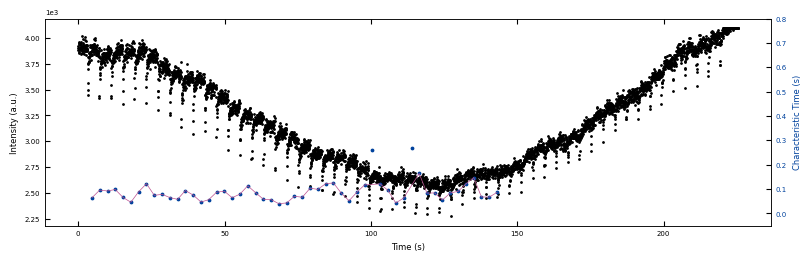

0.10922401963826532


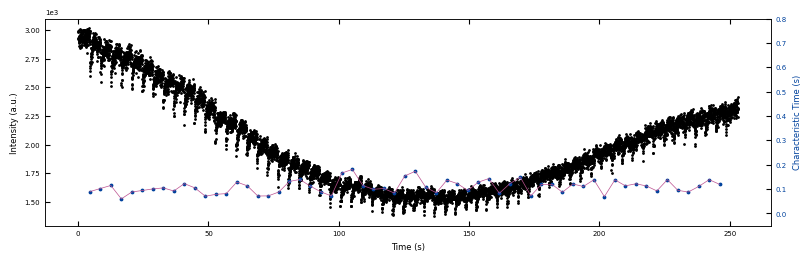

0.11747916012934383


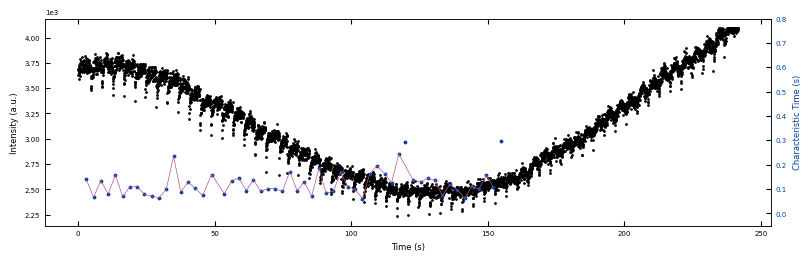

0.1002787191019139


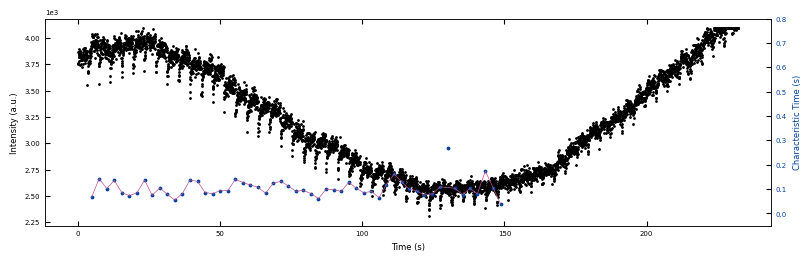

0.11067786785651772


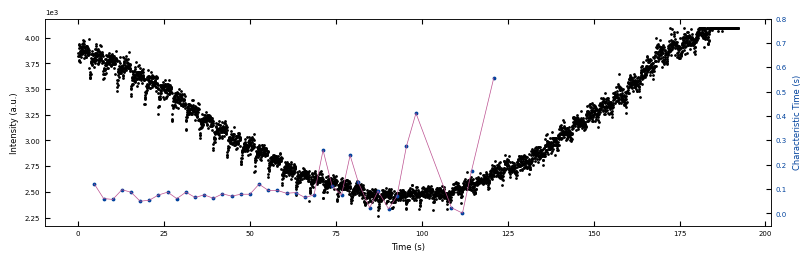

In [34]:
detect_param={'step_size':3, 'prominence':10}
camera_freq = 30
laser_freq = 0.25
viz_curves=False
viz_fittings=False
viz_ab=False

tau_list, temp_list = [], []
for file in glob.glob('./Datasets/8-22-2023/*.txt'):
    parameters_all, x_list_all, info, tau = analyze_txt_rheed(file, camera_freq, laser_freq, detect_param, viz_curves, viz_fittings, viz_ab)
    tau_list.append(tau)
    temp_list.append(int(re.split(r'_', file)[1][:3]))

In [36]:
temp_list

[620, 650, 650, 680, 710]

In [37]:
tau

array([0.08303086, 0.10922402, 0.11747916, 0.10027872, 0.11067787])

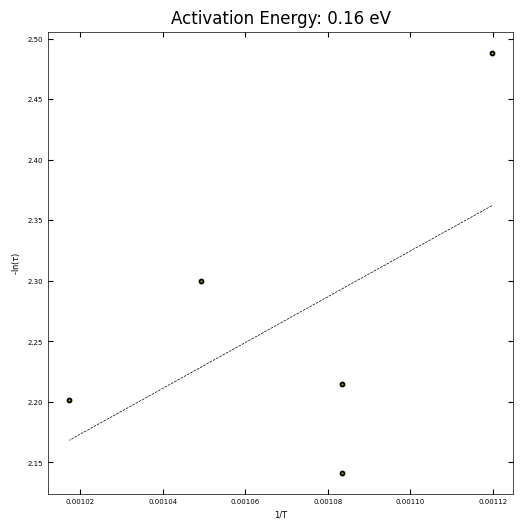

In [38]:
plt.figure(figsize=(6,6))
T = np.array(temp_list) + 273
tau = np.array(tau_list)

x = 1/(T)
y = -np.log(tau)
m, b = np.polyfit(x, y, 1)

plt.scatter(x, y, color='k', s=10)
plt.plot(x, y, 'yo', x, m*x+b, '--k')
plt.xlabel('1/T')
plt.ylabel(r'-ln($\tau$)')
plt.title('Activation Energy: ' + str(round(m*8.617e-5, 2)) + ' eV')
plt.show()

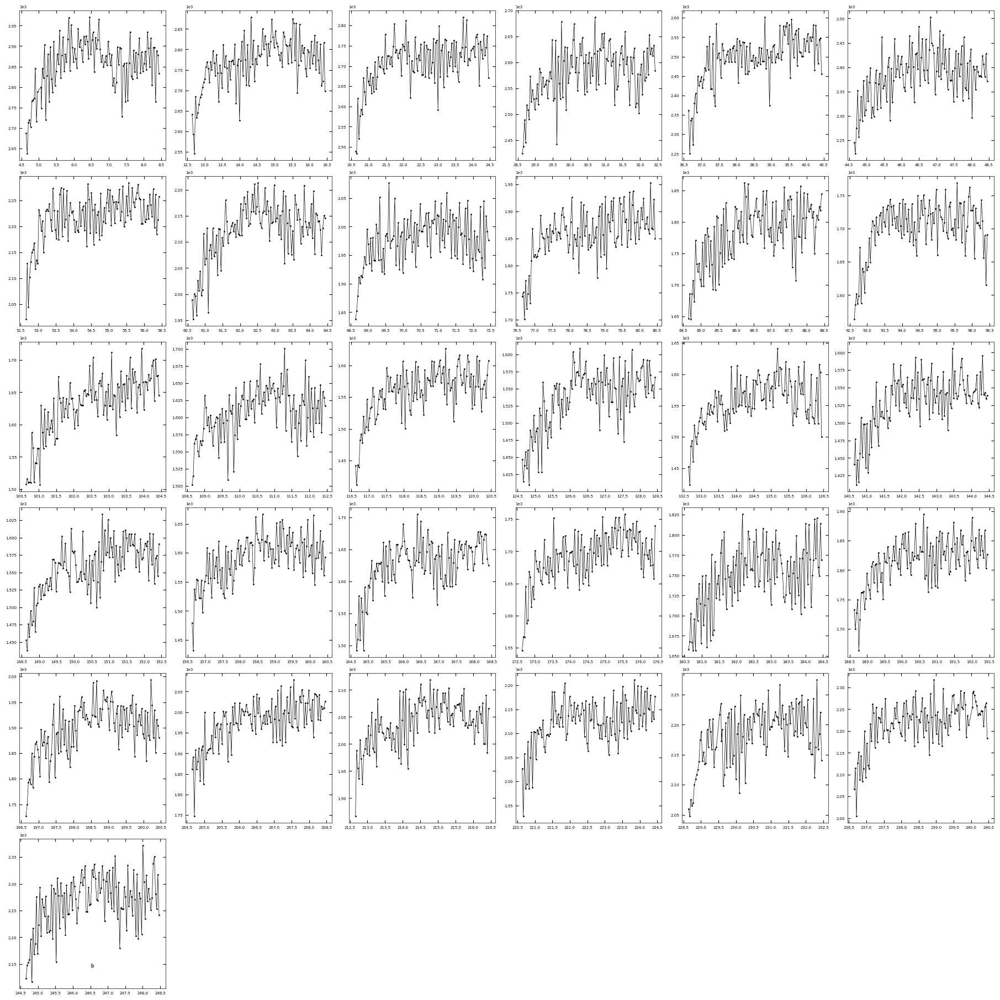

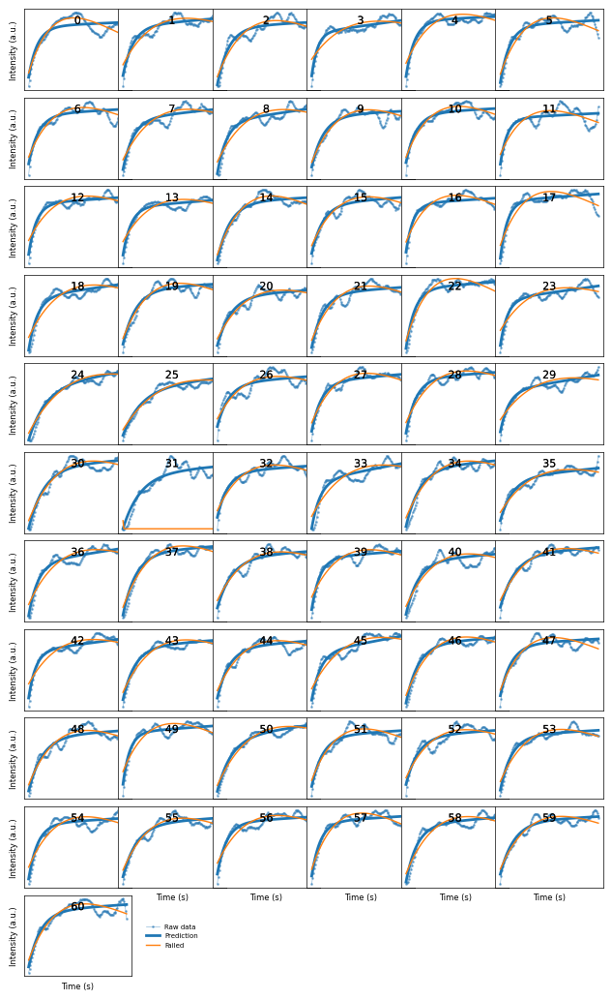

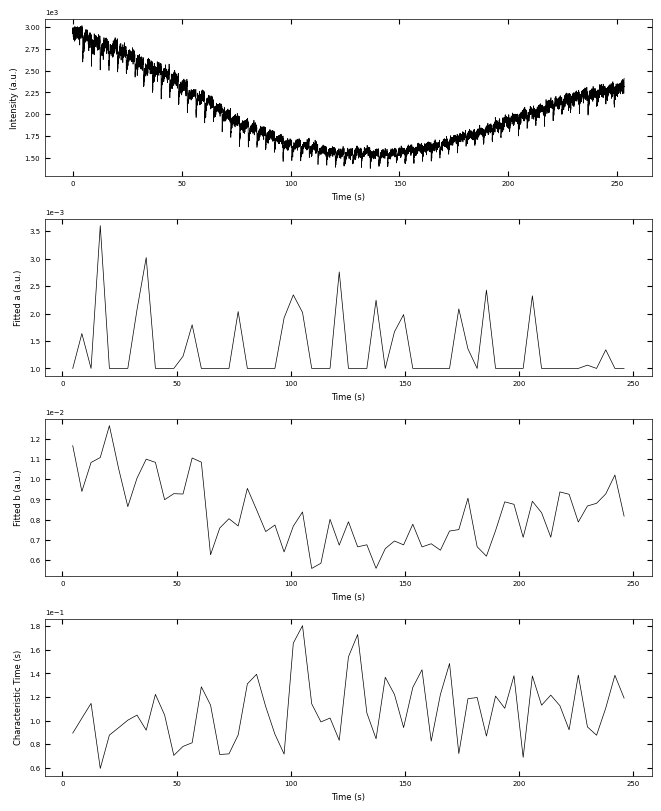

0.10922401963826532


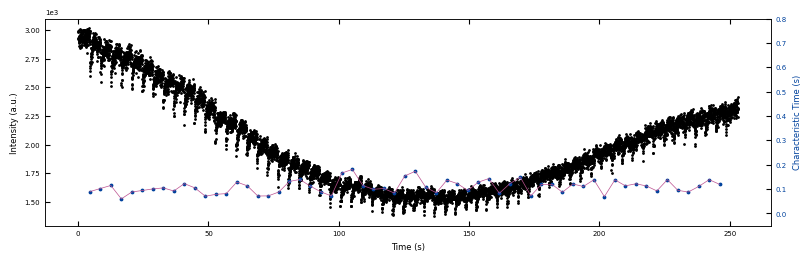

In [13]:
detect_param={'step_size':3, 'prominence':10}
camera_freq = 30
laser_freq = 0.25
viz_curves=True
viz_fittings=True
viz_ab=True
file = './Datasets/8-22-2023/STO_650C_0.25Hz_1.txt'
parameters_all, x_list_all, info, tau_mean = analyze_txt_rheed(file, camera_freq, laser_freq, detect_param, viz_curves, viz_fittings, viz_ab)

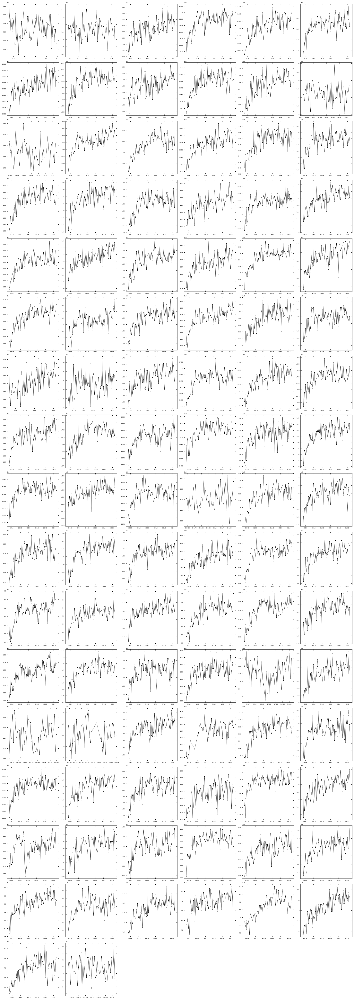

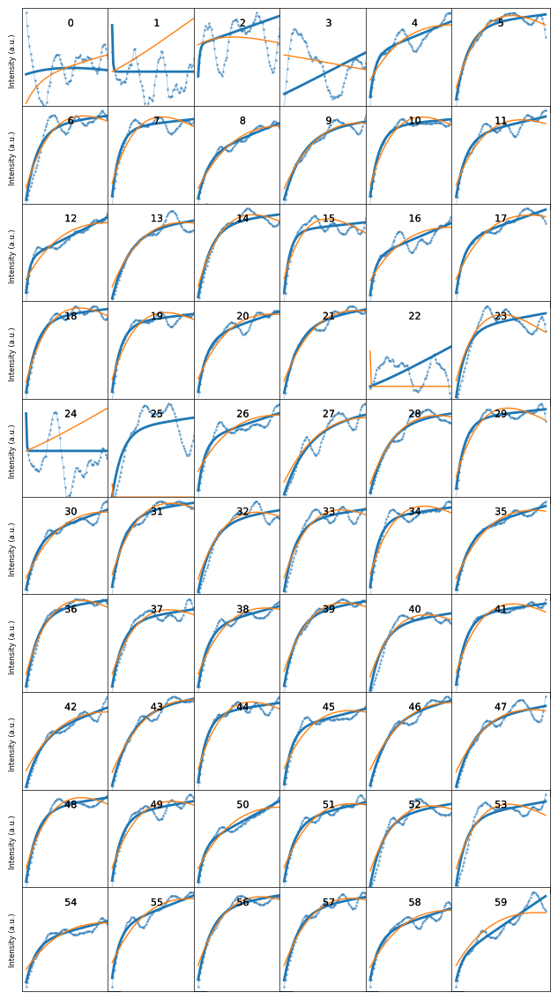

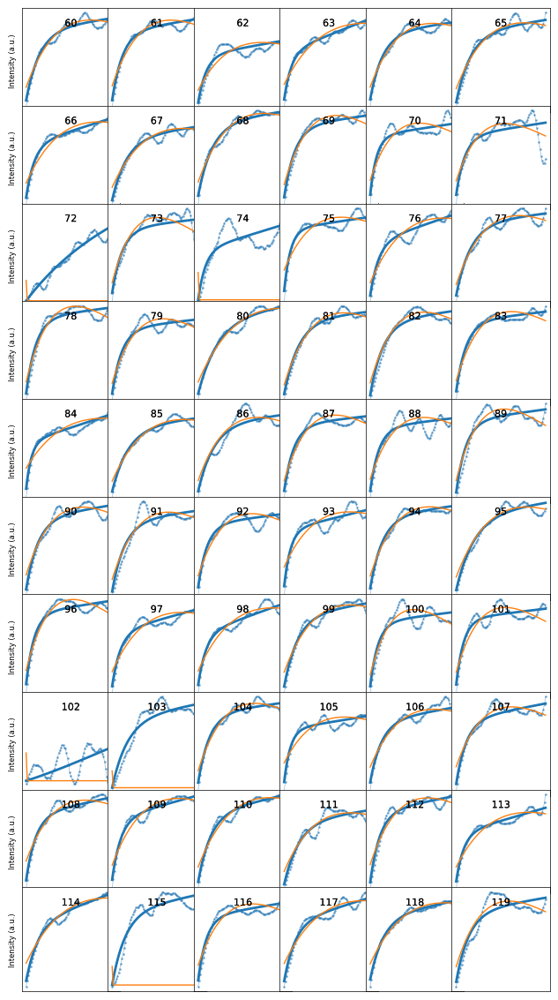

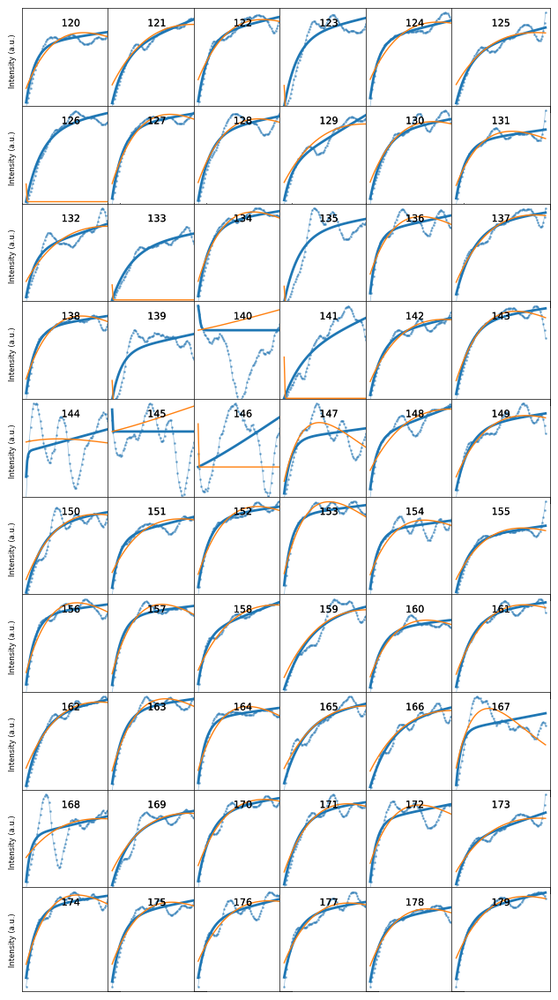

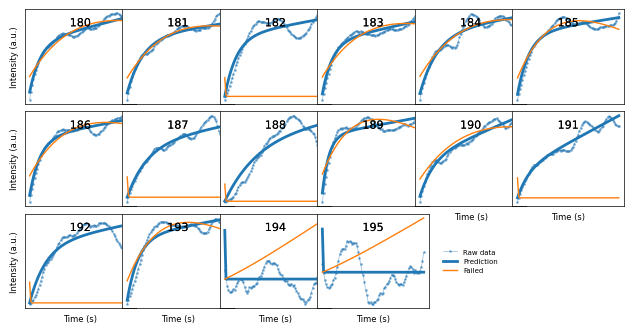

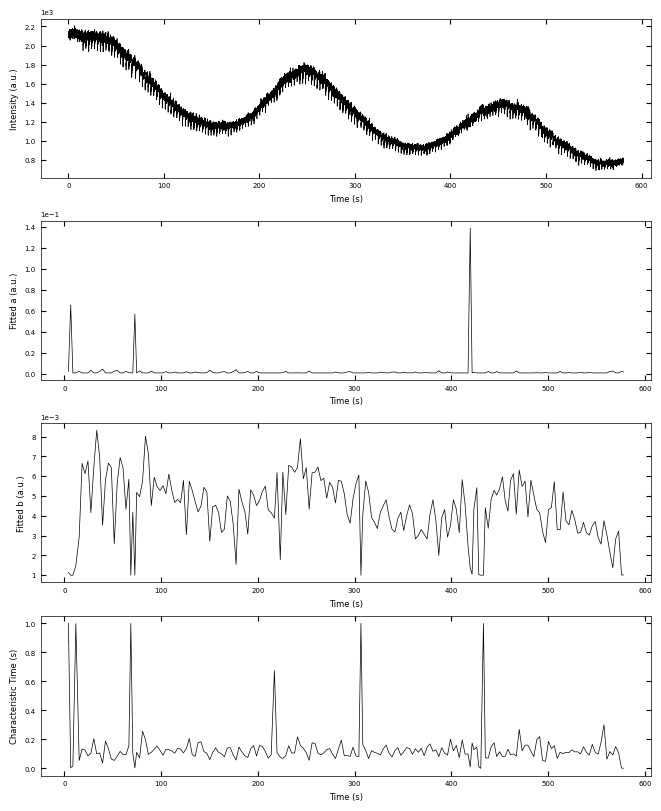

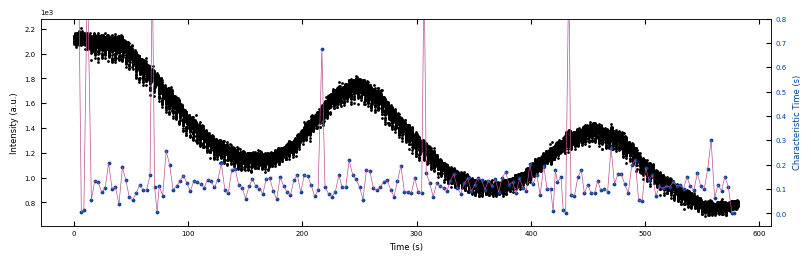

In [ ]:
detect_param={'step_size':3, 'prominence':10}
camera_freq = 30
laser_freq = 0.33
viz_curves=True
viz_fittings=True
viz_ab=True
file = './Datasets/8-21-2023/STO 670C PeterManualRelaxation (.33Hz).txt'
parameters_all, x_list_all, info = analyze_txt_rheed(file, camera_freq, laser_freq, detect_param, viz_curves, viz_fittings, viz_ab)

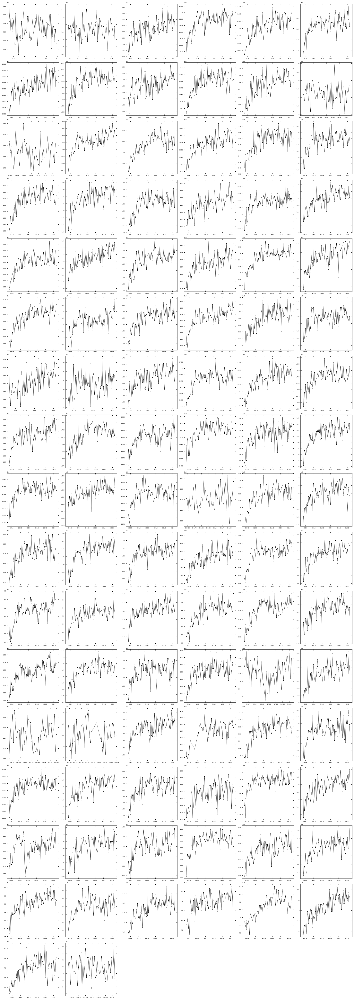

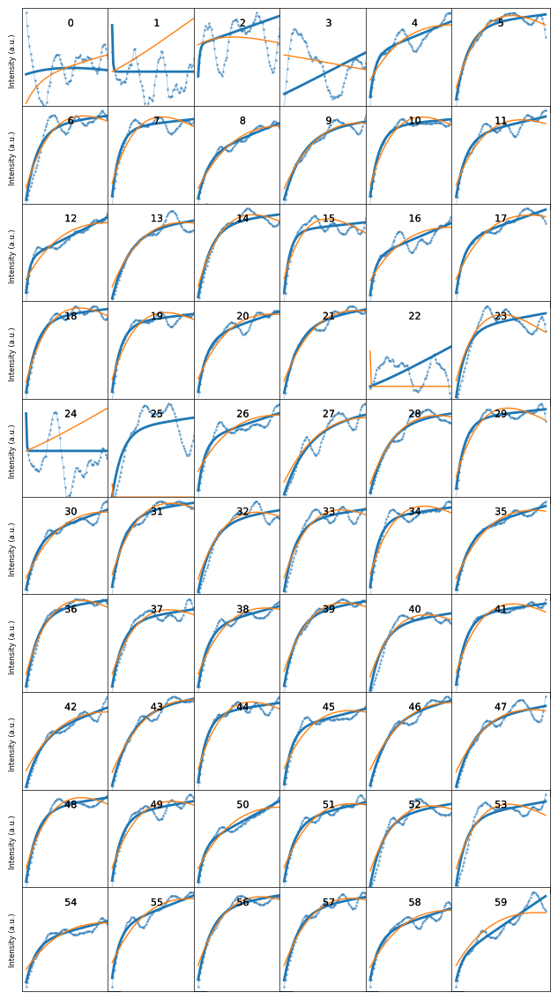

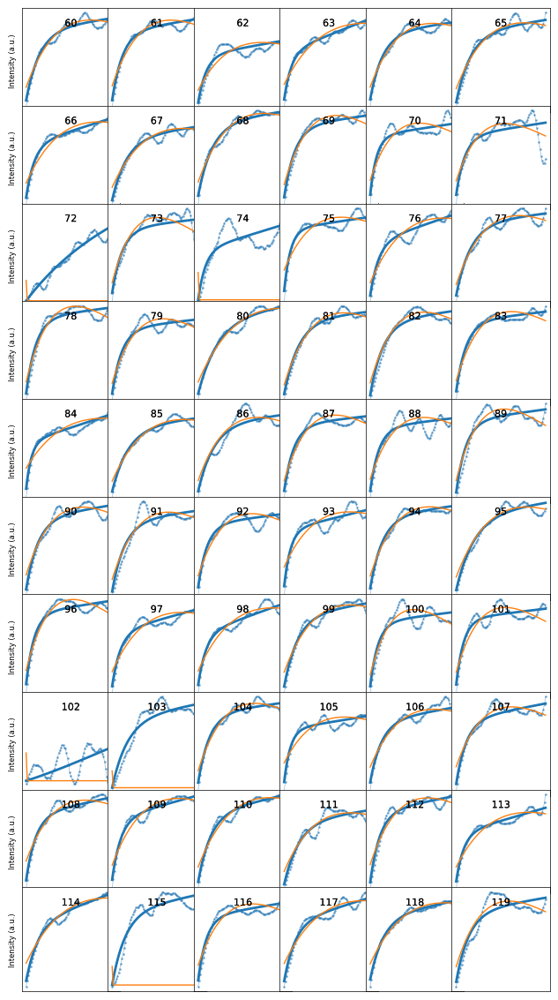

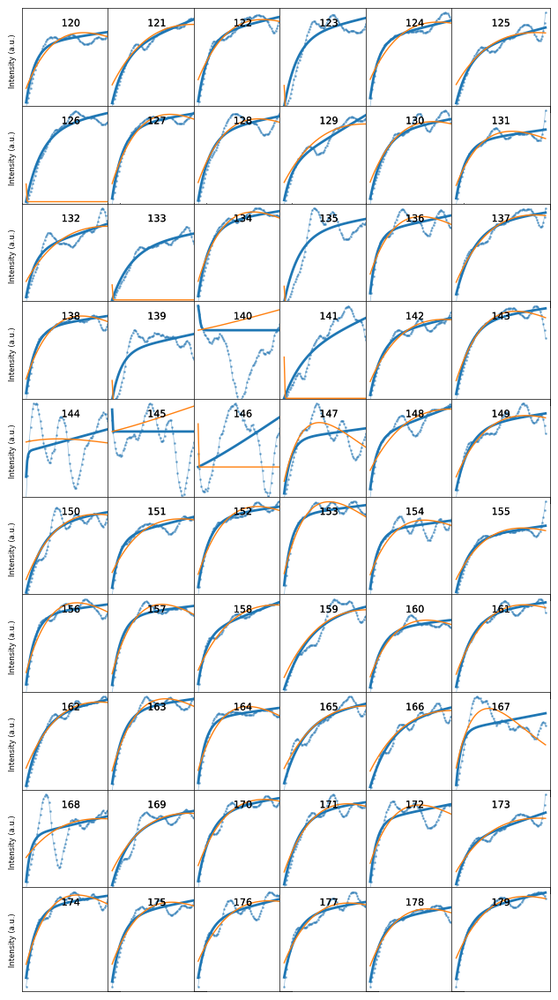

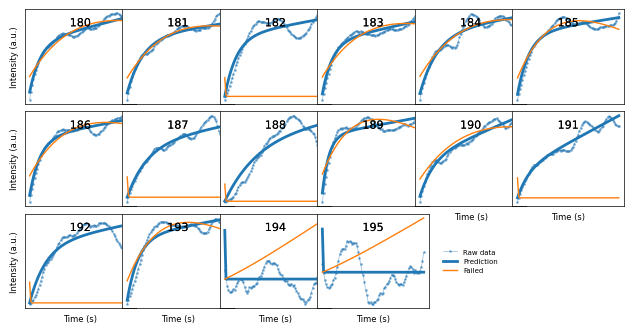

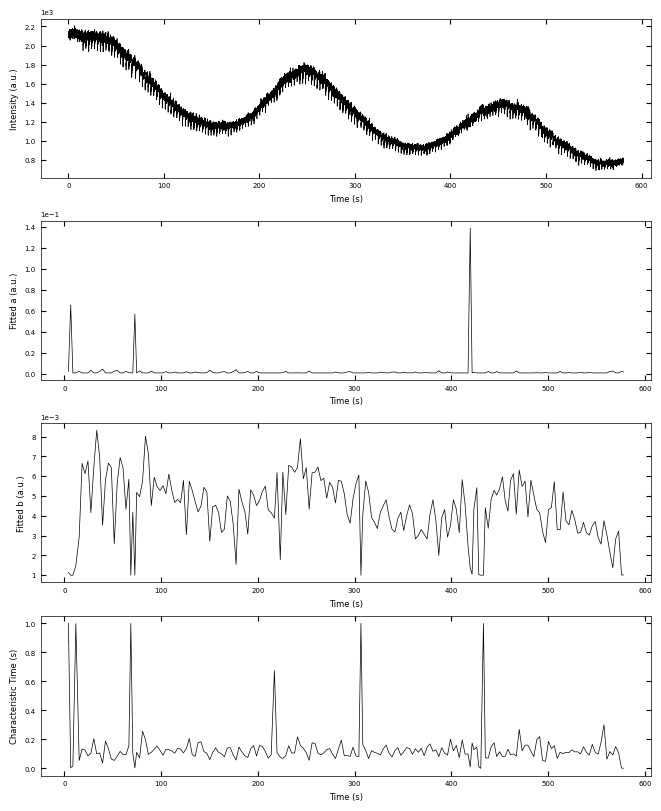

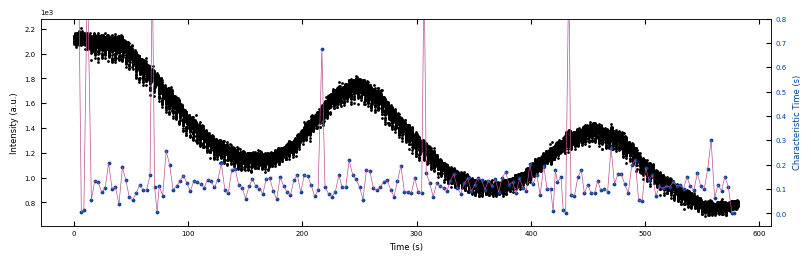

In [ ]:
detect_param={'step_size':3, 'prominence':10}
camera_freq = 30
laser_freq = 0.33
viz_curves=True
viz_fittings=True
viz_ab=True
file = './Datasets/8-21-2023/STO 670C PeterManualRelaxation (.33Hz).txt'
parameters_all, x_list_all, info = analyze_txt_rheed(file, camera_freq, laser_freq, detect_param, viz_curves, viz_fittings, viz_ab)

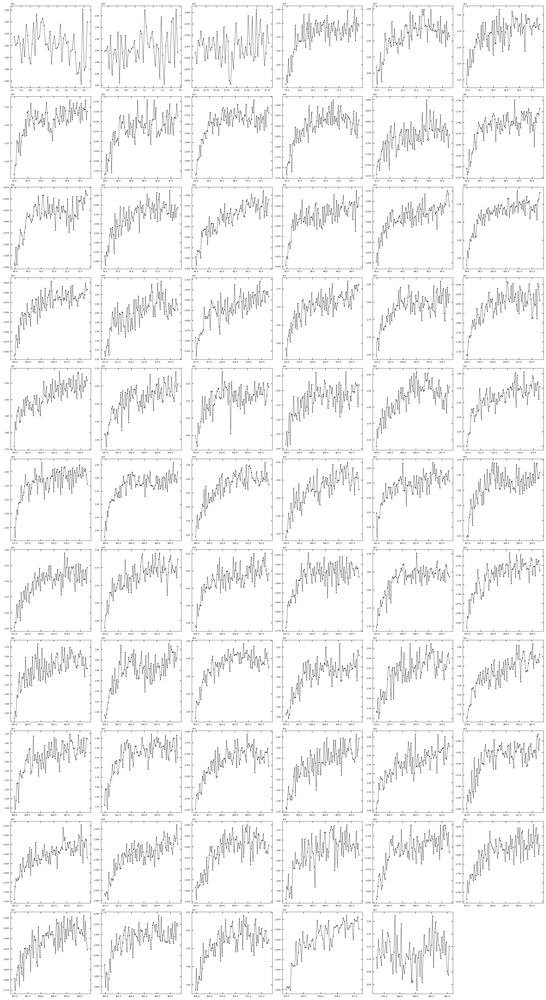

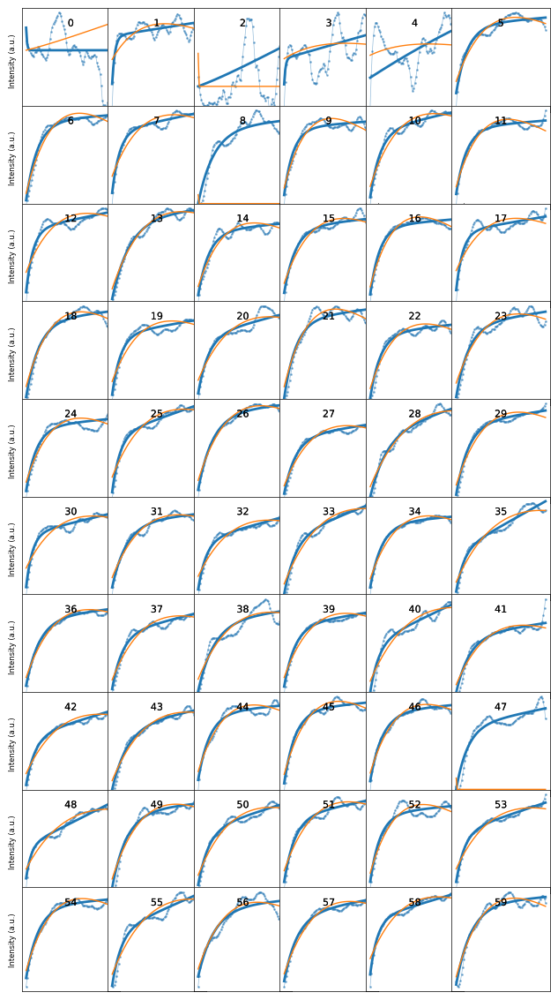

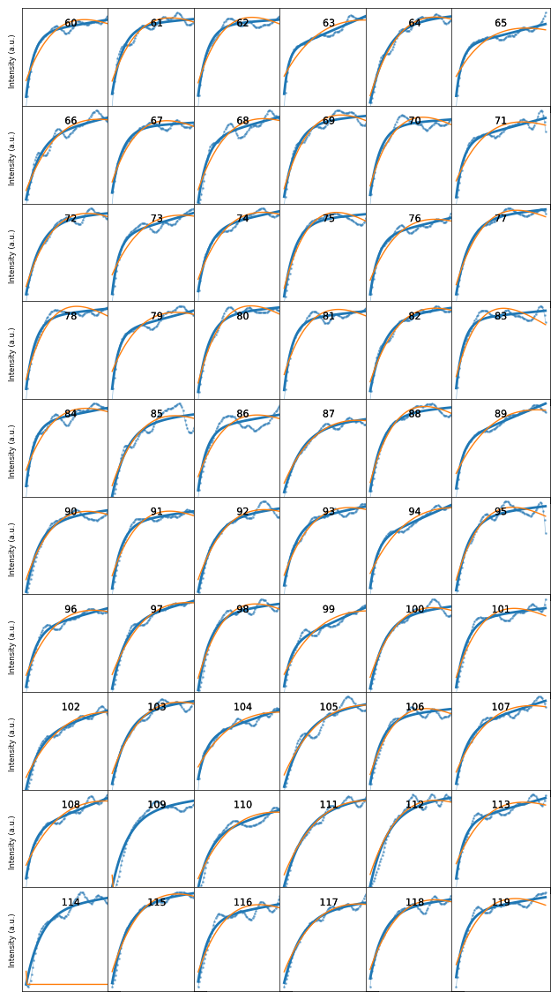

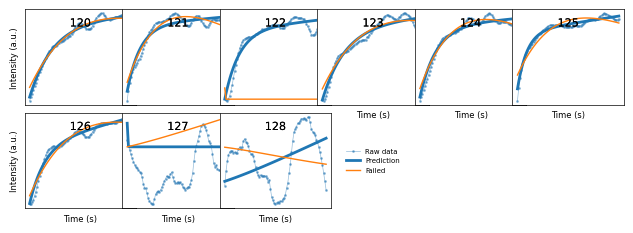

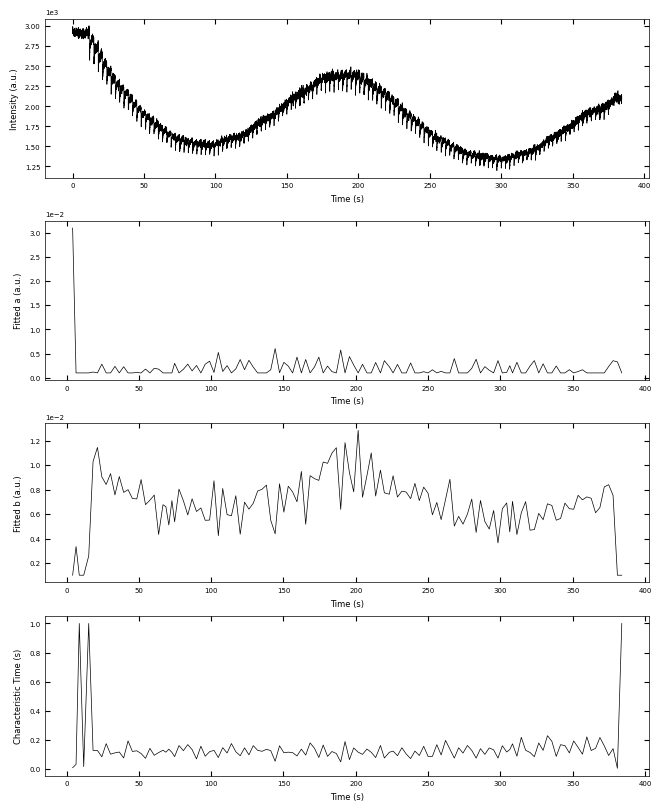

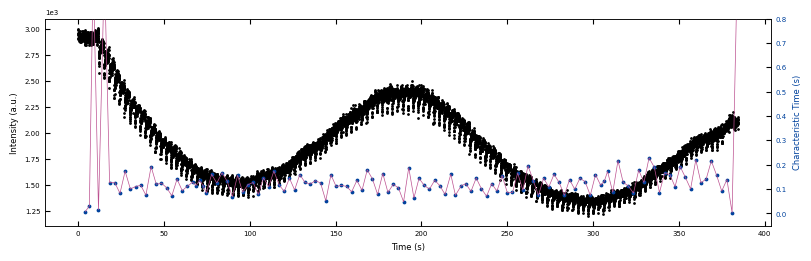

In [ ]:
detect_param={'step_size':3, 'prominence':10}
camera_freq = 30
laser_freq = 0.33
viz_curves=True
viz_fittings=True
viz_ab=True
file = './Datasets/8-21-2023/STO 690C PeterManualRelaxation (.33Hz).txt'
parameters_all, x_list_all, info = analyze_txt_rheed(file, camera_freq, laser_freq, detect_param, viz_curves, viz_fittings, viz_ab)

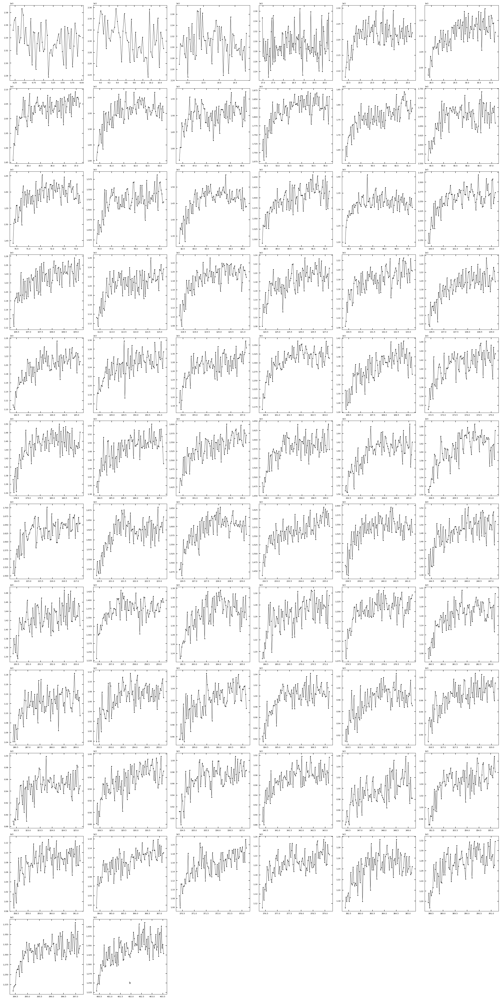

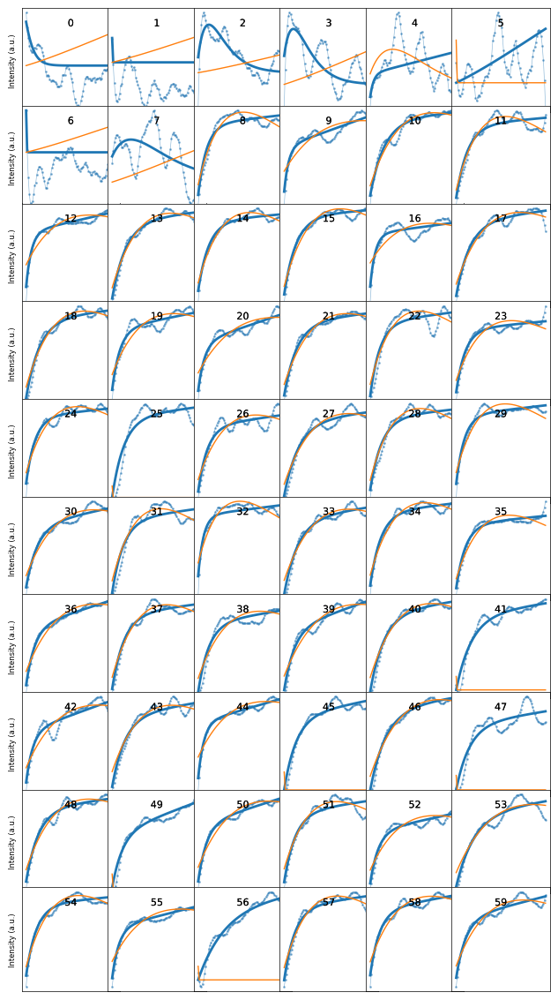

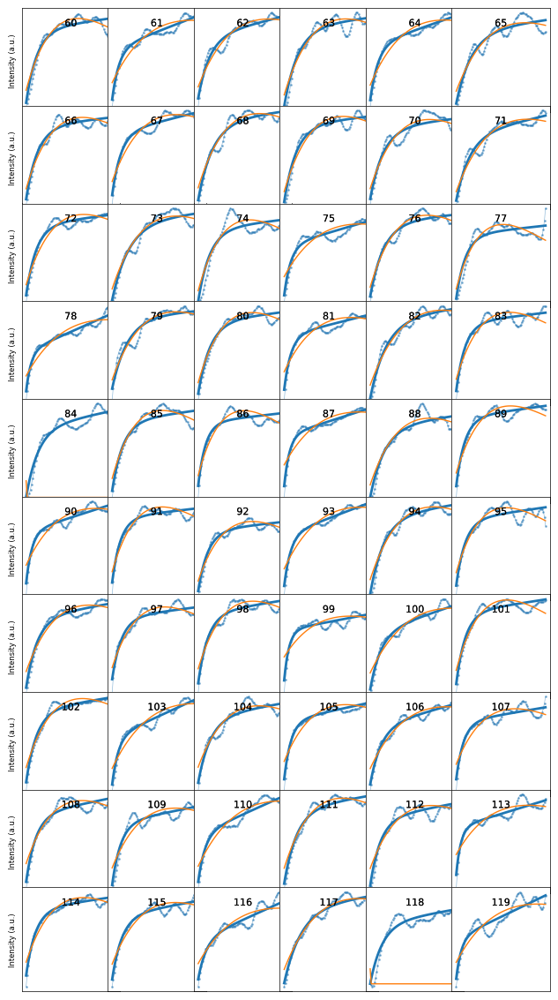

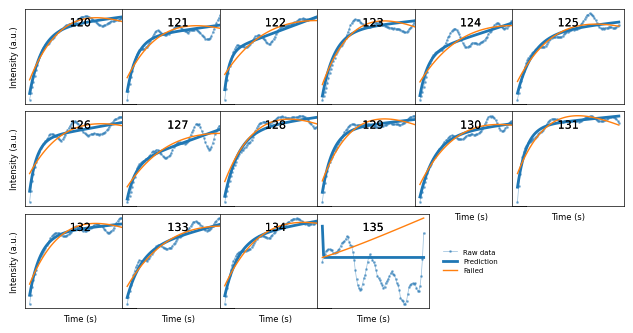

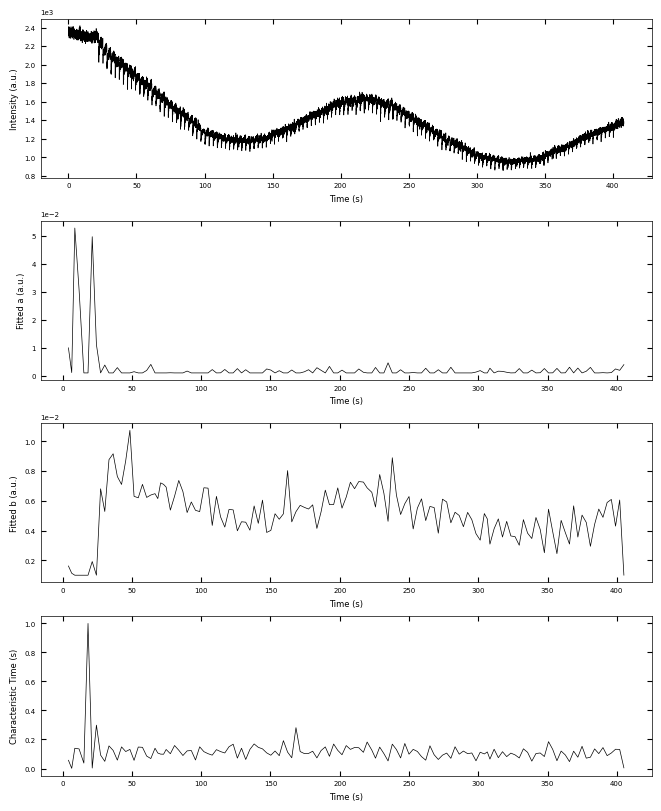

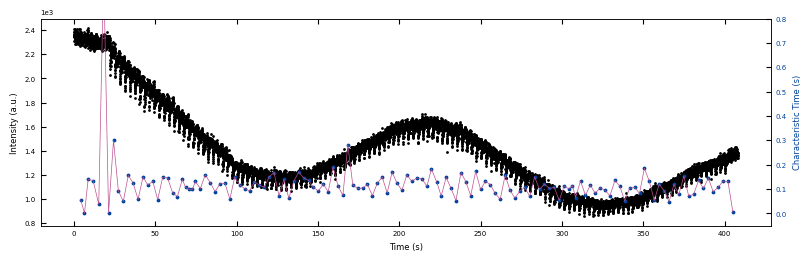

In [ ]:
detect_param={'step_size':3, 'prominence':10}
camera_freq = 30
laser_freq = 0.33
viz_curves=True
viz_fittings=True
viz_ab=True
file = './Datasets/8-21-2023/STO 710C PeterManualRelaxation (.33Hz).txt'
parameters_all, x_list_all, info = analyze_txt_rheed(file, camera_freq, laser_freq, detect_param, viz_curves, viz_fittings, viz_ab)